<img src="https://raw.githubusercontent.com/EO-College/cubes-and-clouds/main/icons/cnc_3icons_process_circle.svg"
     alt="Cubes & Clouds logo"
     style="float: center; margin-right: 10px;" />

# 2.2 Data Discovery & Properties

## GDAL and Data properties

In [1]:
from osgeo import gdal
from pystac_client import Client

import rasterio
import numpy as np
import matplotlib.pyplot as plt

## STAC

### Querying Sentinel-2 Data from a STAC API

In this exercise, we will connect to a public STAC API and search for Sentinel-2 Level-2A products over a specific area (Sardinia) and time range (September 2023). We will filter the results to include only those items with less than or equal to 20% cloud cover. The code retrieves all matching items and prints the number of results, as well as the unique IDs of the returned items. This demonstrates how to query a geospatial data catalog programmatically using the `pystac-client` library- [which documentation can be found here](https://pystac-client.readthedocs.io/).


In [2]:

# Connect to a public STAC API (e.g., Sentinel-2)
catalog = Client.open("https://earth-search.aws.element84.com/v1")

# Search for Sentinel-2 items over a specific area and date range
items = catalog.search(
    collections=["sentinel-2-l2a"],
    datetime="2023-09-01/2023-09-30",
    bbox=[8.0, 40.0, 9.0, 41.0],  # Example bounding box for Sardinia
    query={"eo:cloud_cover": {"lte": 20}}
).item_collection()

# Print the number of items found
print(f"Number of items found: {len(items)}")

# Display the IDs of the found items
for item in items:
    print(item.id)


Number of items found: 22
S2A_32TNK_20230930_0_L2A
S2A_32TML_20230930_0_L2A
S2A_32TNL_20230930_0_L2A
S2B_32TNK_20230928_0_L2A
S2B_32TMK_20230925_0_L2A
S2B_32TMK_20230915_0_L2A
S2B_32TML_20230915_0_L2A
S2B_32TNL_20230915_0_L2A
S2A_32TMK_20230910_0_L2A
S2A_32TNK_20230910_0_L2A
S2A_32TNL_20230910_0_L2A
S2B_32TMK_20230908_0_L2A
S2B_32TNK_20230908_0_L2A
S2B_32TML_20230908_0_L2A
S2B_32TNL_20230908_0_L2A
S2B_32TMK_20230905_0_L2A
S2B_32TNK_20230905_0_L2A
S2B_32TML_20230905_0_L2A
S2B_32TNL_20230905_0_L2A
S2A_32TNK_20230903_0_L2A
S2A_32TML_20230903_0_L2A
S2A_32TNL_20230903_0_L2A


## Filtering by metadata

### Exploring STAC Collections and Querying Sentinel-2 Data

In this exercise, we will connect to a STAC API and explore available data collections. After listing the available collections, we will perform a query to search for Sentinel-2 Level-2A products over a specific area (Sardinia) and time range (September 2023), filtering the results by cloud cover (<= 20%). For each item found, the code will display key metadata including the item ID, acquisition date, cloud cover percentage, and geometry. This demonstrates how to explore and query data in a STAC API using Python.


In [3]:
from pystac_client import Client

# Connect to a STAC API
catalog = Client.open("https://earth-search.aws.element84.com/v1")

# List available collections
collections = catalog.get_collections()
print("Available Collections:")
for collection in collections:
    print(collection.id)

# Search for items in a specific collection
items = catalog.search(
    collections=["sentinel-2-l2a"],
    datetime="2023-09-01/2023-09-30",
    bbox=[8.0, 40.0, 9.0, 41.0],  # Example bounding box for Sardinia
    query={"eo:cloud_cover": {"lte": 20}}
).item_collection()

# Display metadata for the found items
for item in items:
    print(f"ID: {item.id}")
    print(f"Date: {item.datetime}")
    print(f"Cloud Cover: {item.properties['eo:cloud_cover']}%")
    print(f"Geometry: {item.geometry}")
    print("-" * 40)


Available Collections:
sentinel-2-pre-c1-l2a
cop-dem-glo-30
naip
cop-dem-glo-90
landsat-c2-l2
sentinel-2-l2a
sentinel-2-l1c
sentinel-2-c1-l2a
sentinel-1-grd
ID: S2A_32TNK_20230930_0_L2A
Date: 2023-09-30 10:19:46.535000+00:00
Cloud Cover: 0.000919%
Geometry: {'type': 'Polygon', 'coordinates': [[[8.999775264333298, 40.650847506566784], [8.99977850198158, 39.66161596790567], [10.279630591063311, 39.65456644304081], [10.298328663178303, 40.64354834012356], [8.999775264333298, 40.650847506566784]]]}
----------------------------------------
ID: S2A_32TML_20230930_0_L2A
Date: 2023-09-30 10:19:35.271000+00:00
Cloud Cover: 0.817908%
Geometry: {'type': 'Polygon', 'coordinates': [[[8.497392318630403, 41.550737256687974], [8.19162783750282, 40.55993074379032], [9.115279767345573, 40.56270140747389], [9.117019627222117, 41.55177612128904], [8.497392318630403, 41.550737256687974]]]}
----------------------------------------
ID: S2A_32TNL_20230930_0_L2A
Date: 2023-09-30 10:19:32.132000+00:00
Cloud Cov

## GDAL

## Open COG file with red band for the first item and inspect properties

### Accessing and Inspecting a Sentinel-2 Red Band Raster

In this exercise, we will access the first Sentinel-2 item from a previously retrieved STAC search result and extract the URL for the red band. Using GDAL, we will open the raster file from this URL and inspect its metadata, including the raster size, coordinate reference system (CRS), and geotransform parameters. This demonstrates how to programmatically access specific assets within a STAC item and retrieve relevant geospatial metadata.


### Inspect the structure of items, available assets and properties

In [4]:
items

In [5]:
items[0].properties

{'created': '2023-09-30T20:45:31.209Z',
 'platform': 'sentinel-2a',
 'constellation': 'sentinel-2',
 'instruments': ['msi'],
 'eo:cloud_cover': 0.000919,
 'proj:epsg': 32632,
 'mgrs:utm_zone': 32,
 'mgrs:latitude_band': 'T',
 'mgrs:grid_square': 'NK',
 'grid:code': 'MGRS-32TNK',
 'view:sun_azimuth': 161.421137404133,
 'view:sun_elevation': 45.4580229014601,
 's2:degraded_msi_data_percentage': 0,
 's2:nodata_pixel_percentage': 0,
 's2:saturated_defective_pixel_percentage': 0,
 's2:dark_features_percentage': 0.406687,
 's2:cloud_shadow_percentage': 0,
 's2:vegetation_percentage': 36.703816,
 's2:not_vegetated_percentage': 17.434995,
 's2:water_percentage': 45.428509,
 's2:unclassified_percentage': 0.02506,
 's2:medium_proba_clouds_percentage': 0.000756,
 's2:high_proba_clouds_percentage': 0.000146,
 's2:thin_cirrus_percentage': 1.7e-05,
 's2:snow_ice_percentage': 1.3e-05,
 's2:product_type': 'S2MSI2A',
 's2:processing_baseline': '05.09',
 's2:product_uri': 'S2A_MSIL2A_20230930T100811_N05

In [6]:
first_item = items[0]

asset_red_href = first_item.assets['red'].href  # Assuming B04 (red band) is available

# Open and inspect the raster file
dataset = gdal.Open(asset_red_href)
print(f"Raster Size: {dataset.RasterXSize} x {dataset.RasterYSize}")
print(f"Projection: {dataset.GetProjection()}")
print(f"GeoTransform: {dataset.GetGeoTransform()}")

/home/conda/cubes-and-clouds/ba3078e498dcb4eb69932f5a147e31562bbe40972bc0300f937fe23191e0b8b0-20240222-085455-136339-389-cubes-and-clouds2/lib/python3.11/site-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


Raster Size: 10980 x 10980
Projection: PROJCS["WGS 84 / UTM zone 32N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",9],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32632"]]
GeoTransform: (499980.0, 10.0, 0.0, 4500000.0, 0.0, -10.0)


### Reading Raster Data with GDAL

In this exercise, we will use GDAL to open a raster file and extract important metadata. The code retrieves the number of bands in the raster, the spatial resolution (pixel size), and the coordinate reference system (CRS). This is a fundamental operation in geospatial analysis, helping us understand the structure and spatial properties of the raster data before performing further analysis.


In [7]:
# Open a raster file
#raster_file = 'path_to_your_raster_file.tif'
dataset = gdal.Open(asset_red_href)

# Get the number of bands
bands = dataset.RasterCount
print(f"Number of Bands: {bands}")

# Get spatial resolution
geotransform = dataset.GetGeoTransform()
pixel_width = geotransform[1]
pixel_height = geotransform[5]
print(f"Pixel Size: {pixel_width} x {pixel_height}")

# Get coordinate reference system
projection = dataset.GetProjection()
print(f"Coordinate Reference System: {projection}")


Number of Bands: 1
Pixel Size: 10.0 x -10.0
Coordinate Reference System: PROJCS["WGS 84 / UTM zone 32N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",9],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32632"]]


### NDVI Computation Using Windowed Processing to reduce memory consumption

In this exercise, we compute the Normalized Difference Vegetation Index (NDVI) using a memory-efficient approach by reading and processing the red and near-infrared (NIR) bands in small chunks (windows). Instead of loading the entire image into memory at once, which can be resource-intensive, we process the data block-by-block to reduce memory usage. This is particularly useful when working with large geospatial datasets, such as Sentinel-2 imagery. The NDVI is calculated for each window, and the results are combined to produce the final NDVI image.


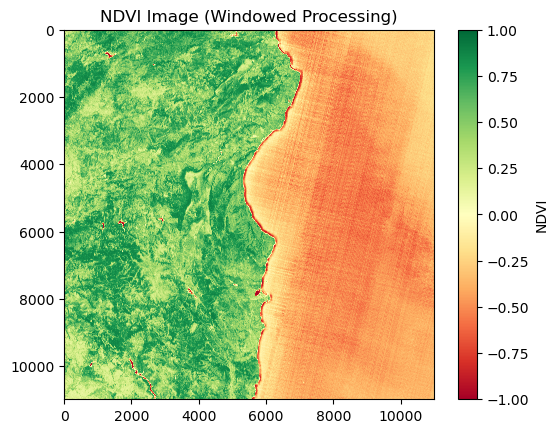

In [10]:
asset_red_href = first_item.assets['red'].href  
asset_nir_href = first_item.assets['nir'].href 

# Open the red and NIR band files
with rasterio.open(asset_red_href) as red_src, rasterio.open(asset_nir_href) as nir_src:

    meta = red_src.meta

    # Create an empty array to store the NDVI values
    ndvi = np.zeros(red_src.shape, dtype=np.float32)

    # Define the window size (e.g., 512x512 chunks)
    window_size = 512

    for ji, window in red_src.block_windows(1):
        red = red_src.read(1, window=window).astype(float)
        nir = nir_src.read(1, window=window).astype(float)

        # Compute NDVI for the window
        ndvi_window = (nir - red) / (nir + red + 1e-6)  # Add small value to avoid division by zero

        # Store the computed NDVI for the current window
        ndvi[window.row_off:window.row_off + window.height, window.col_off:window.col_off + window.width] = ndvi_window

    # Plot the result
    plt.imshow(ndvi, cmap='RdYlGn')
    plt.colorbar(label='NDVI')
    plt.title('NDVI Image (Windowed Processing)')
    plt.show()
